In [1]:
import os, sys, glob
from matplotlib import pyplot as plt
plt.style.use('science')

sys.path.insert(0,"/home/nico/Documents/TEAR/Codes_TEAR/se2dr/se2wave/utils/python/")
sys.path.insert(0,"/home/nico/Documents/TEAR/Codes_TEAR/PythonCodes/LibFolder")

from Lib_GeneralFunctions import *
from Lib_ProfilePlotting import *
from Lib_ProfileProcessing import *
from Lib_SigmoidProcessing import *
from Lib_SpectrogramPlot import *
from Lib_GeneralSignalProcNAnalysis import *

import pandas as pd

In [2]:
from palettable.scientific.sequential import Nuuk_20 as ElColor

cmap = ElColor.mpl_colormap

In [3]:
SMALL_SIZE = 14
MEDIUM_SIZE = 16
BIGGER_SIZE = 20
FontSizeControlFreak(SMALL_SIZE,MEDIUM_SIZE,BIGGER_SIZE)

In [4]:
FolderPath = '/home/nico/LRZ Sync+Share/SharedWolfel/PaperData/Output/20211122/'
Filename = 'Receiver_TPV3_T0_P3_025x025_d1.001.pickle'
ListReceivers = LoadPickleFile(FolderPath, Filename)

ListReceivers

[Single Receiver ([0, 25]),
 Single Receiver ([0, 50]),
 Single Receiver ([0, 75]),
 Single Receiver ([0, 100]),
 Single Receiver ([0, 150]),
 Single Receiver ([0, 200]),
 Single Receiver ([0, 300]),
 Single Receiver ([0, 400]),
 Single Receiver ([0, 500]),
 Single Receiver ([2000, 25]),
 Single Receiver ([2000, 50]),
 Single Receiver ([2000, 75]),
 Single Receiver ([2000, 100]),
 Single Receiver ([2000, 150]),
 Single Receiver ([2000, 200]),
 Single Receiver ([2000, 300]),
 Single Receiver ([2000, 400]),
 Single Receiver ([2000, 500]),
 Single Receiver ([4000, 25]),
 Single Receiver ([4000, 50]),
 Single Receiver ([4000, 75]),
 Single Receiver ([4000, 100]),
 Single Receiver ([4000, 150]),
 Single Receiver ([4000, 200]),
 Single Receiver ([4000, 300]),
 Single Receiver ([4000, 400]),
 Single Receiver ([4000, 500]),
 Single Receiver ([6000, 25]),
 Single Receiver ([6000, 50]),
 Single Receiver ([6000, 75]),
 Single Receiver ([6000, 100]),
 Single Receiver ([6000, 150]),
 Single Receive

## Velocity Plot

[6000, 25]

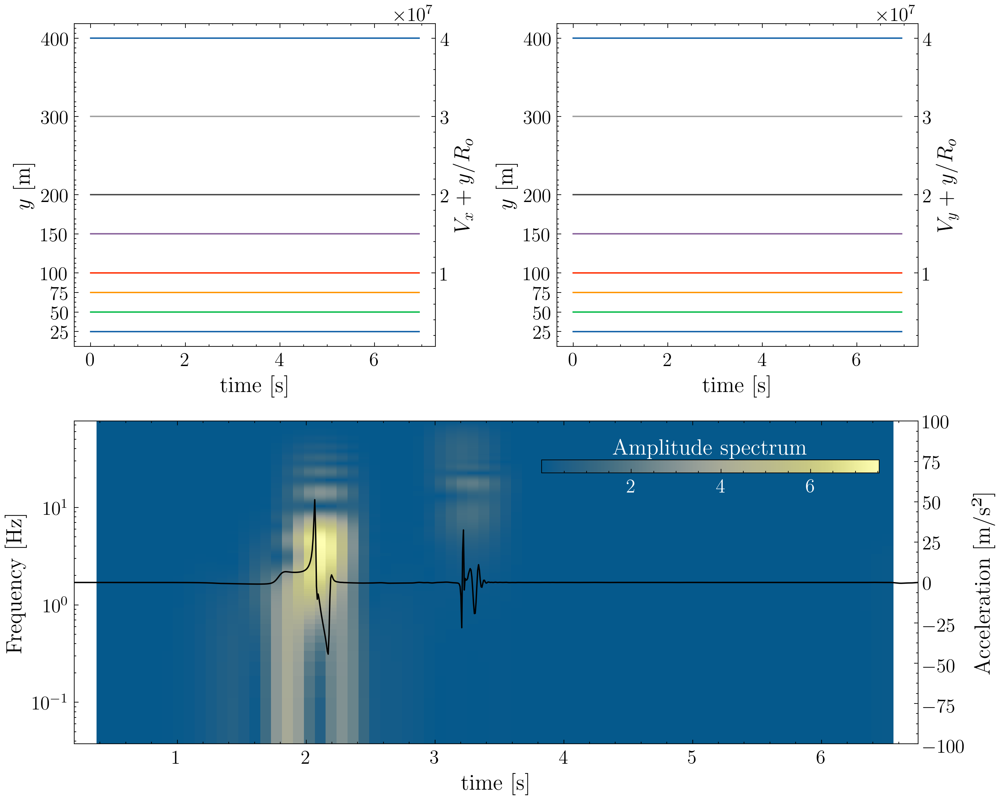

In [5]:
fig = plt.figure(figsize = (10, 8),dpi=300, constrained_layout=True)
gs = fig.add_gridspec(2, 2)
ax = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1],sharey=ax)

axBot = fig.add_subplot(gs[1, :])


scaling = 1e-5

StationIDX = 3*9

for j in range(8):
    
    i = StationIDX + j
    Ycoord = float(ListReceivers[i].Coord[1]/scaling)

    Time, Amplitude = SortReceiver(ListReceivers[i],ListReceivers[i].VelX)
    #Amplitude = np.asarray(pd.Series(np.gradient(Amplitude, Time).tolist()))
    OffsetAmplitude = list(map(lambda x: x + Ycoord, Amplitude))

    ax.plot(Time, OffsetAmplitude)
    
    Time, Amplitude = SortReceiver(ListReceivers[i],ListReceivers[i].VelY)
    #Amplitude = np.asarray(pd.Series(np.gradient(Amplitude, Time).tolist()))
    OffsetAmplitude = list(map(lambda x: x + Ycoord, Amplitude))

    ax2.plot(Time, OffsetAmplitude)
    
axT = ax.twinx()
axT.set_ylim(ax.get_ylim())

axT.set_ylabel("$V_x + y/R_o$")

ax.set_yticks([ListReceivers[StationIDX+j].Coord[1]/scaling for j in range(8)])
ax.set_yticklabels([ListReceivers[StationIDX+j].Coord[1] for j in range(8)])
ax.set_ylabel("$y$ [m]")
ax.set_xlabel("time [s]")


ax2T = ax2.twinx()
ax2T.set_ylim(ax2.get_ylim())

ax2T.set_ylabel("$V_y + y/R_o$")

ax2.set_yticks([ListReceivers[StationIDX+j].Coord[1]/scaling for j in range(8)])
ax2.set_yticklabels([ListReceivers[StationIDX+j].Coord[1] for j in range(8)])
ax2.set_ylabel("$y$ [m]")
ax2.set_xlabel("time [s]")

axBot,axBot2 = Receiver2GradientSpectrogram(ListReceivers[StationIDX], ListReceivers[StationIDX].VelY, yLabel="Acceleration [m/s²]", 
                         wlen = 40, mult=20, cmap=cmap, **{"ax": axBot})

axBot.set_xlim([0.2,6.75])
axBot2.set_ylim([-1e2,1e2])
ListReceivers[StationIDX].Coord

[6000, 150]

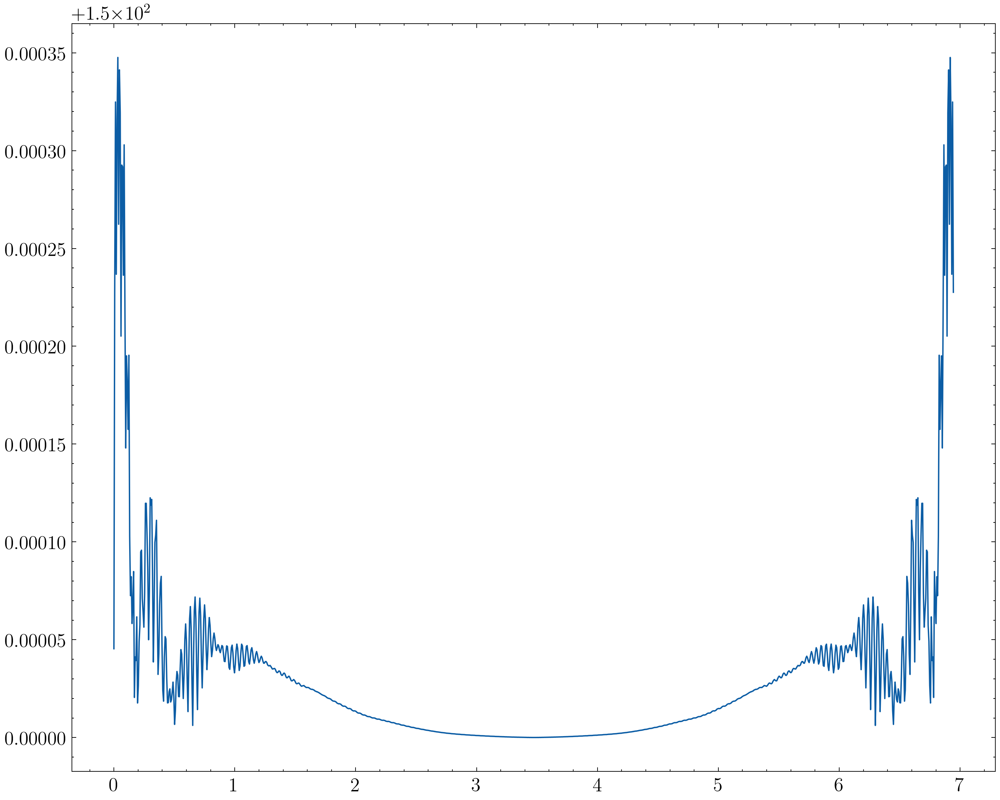

In [10]:
fig = plt.figure(figsize = (10, 8),dpi=300, constrained_layout=True)
gs = fig.add_gridspec(1, 1)
ax = fig.add_subplot(gs[0, 0])

i = StationIDX + 4
Ycoord = float(ListReceivers[i].Coord[1]/scaling)

Time, Amplitude = SortReceiver(ListReceivers[i],ListReceivers[i].VelX)
Amplitude = np.asarray(pd.Series(np.gradient(Amplitude, Time).tolist()))
TTime, Amplitude=CalculateFFT(Amplitude, sampling = (Time[2]-Time[1])/len(Time), TMax = Time[-1])
OffsetAmplitude = list(map(lambda x: x + Ycoord, Amplitude))

ax.plot(Time,OffsetAmplitude)
ListReceivers[i].Coord

## Acceleration plot

[6000, 25]

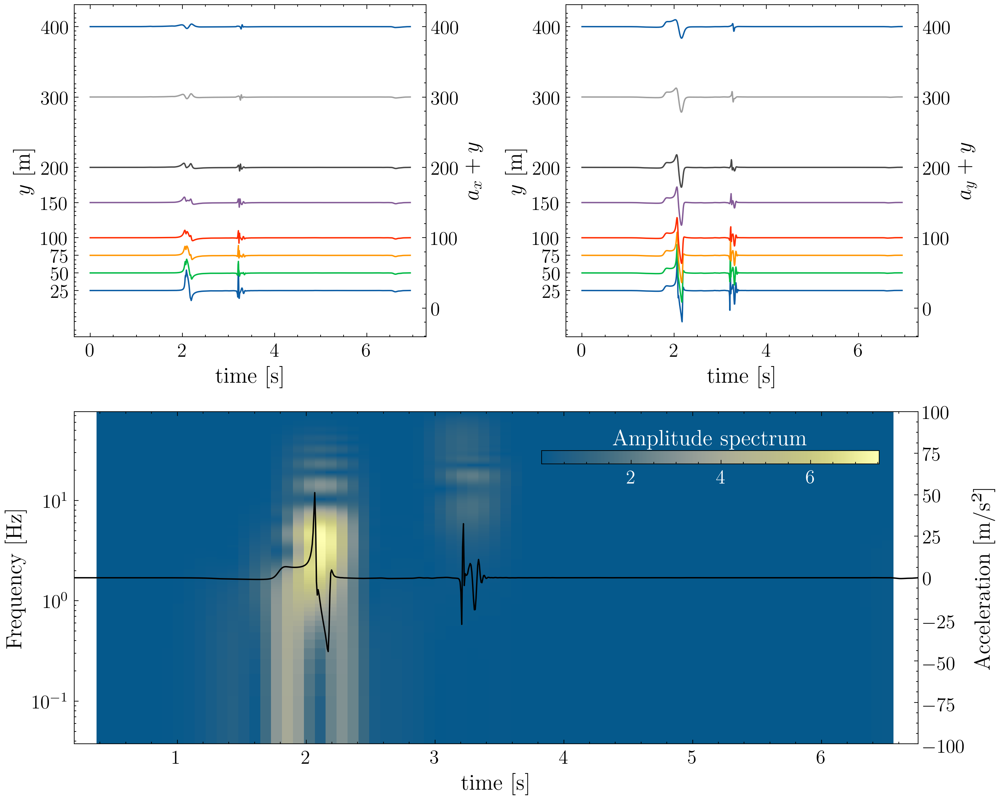

In [7]:
fig = plt.figure(figsize = (10, 8),dpi=300, constrained_layout=True)
gs = fig.add_gridspec(2, 2)
ax = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1],sharey=ax)

axBot = fig.add_subplot(gs[1, :])


scaling = 1

StationIDX = 3*9

for j in range(8):
    
    i = StationIDX + j
    Ycoord = float(ListReceivers[i].Coord[1]/scaling)

    Time, Amplitude = SortReceiver(ListReceivers[i],ListReceivers[i].VelX)
    Amplitude = np.asarray(pd.Series(np.gradient(Amplitude, Time).tolist()))

    OffsetAmplitude = list(map(lambda x: x + Ycoord, Amplitude))

    ax.plot(Time, OffsetAmplitude)
    
    Time, Amplitude = SortReceiver(ListReceivers[i],ListReceivers[i].VelY)
    Amplitude = np.asarray(pd.Series(np.gradient(Amplitude, Time).tolist()))
    OffsetAmplitude = list(map(lambda x: x + Ycoord, Amplitude))

    ax2.plot(Time, OffsetAmplitude)
    
axT = ax.twinx()
axT.set_ylim(ax.get_ylim())

axT.set_ylabel("$a_x + y$")

ax.set_yticks([ListReceivers[StationIDX+j].Coord[1]/scaling for j in range(8)])
ax.set_yticklabels([ListReceivers[StationIDX+j].Coord[1] for j in range(8)])
ax.set_ylabel("$y$ [m]")
ax.set_xlabel("time [s]")


ax2T = ax2.twinx()
ax2T.set_ylim(ax2.get_ylim())

ax2T.set_ylabel("$a_y + y$")

ax2.set_yticks([ListReceivers[StationIDX+j].Coord[1]/scaling for j in range(8)])
ax2.set_yticklabels([ListReceivers[StationIDX+j].Coord[1] for j in range(8)])
ax2.set_ylabel("$y$ [m]")
ax2.set_xlabel("time [s]")

axBot,axBot2 = Receiver2GradientSpectrogram(ListReceivers[StationIDX], ListReceivers[StationIDX].VelY, yLabel="Acceleration [m/s²]", 
                         wlen = 40, mult=20, cmap=cmap, **{"ax": axBot})

axBot.set_xlim([0.2,6.75])
axBot2.set_ylim([-1e2,1e2])
ListReceivers[StationIDX].Coord

/home/nico/miniconda3/envs/jane/lib/python3.5/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


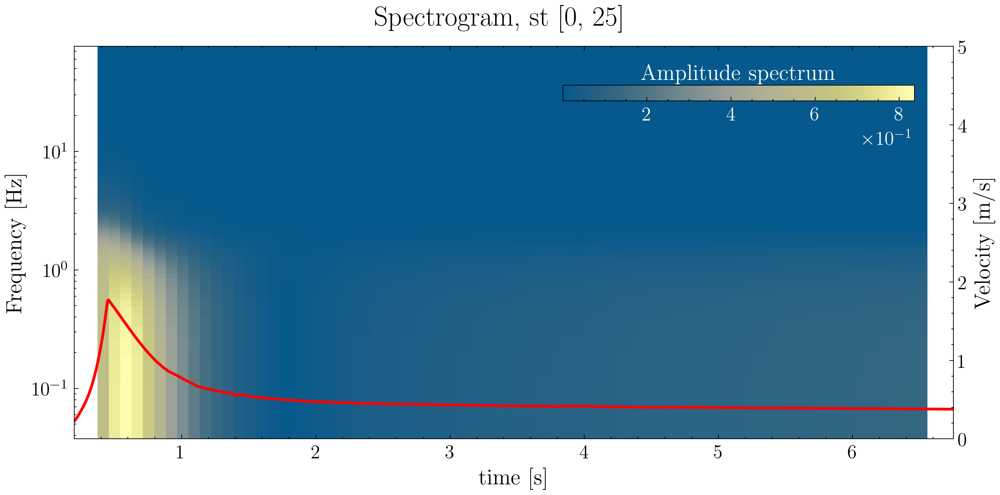

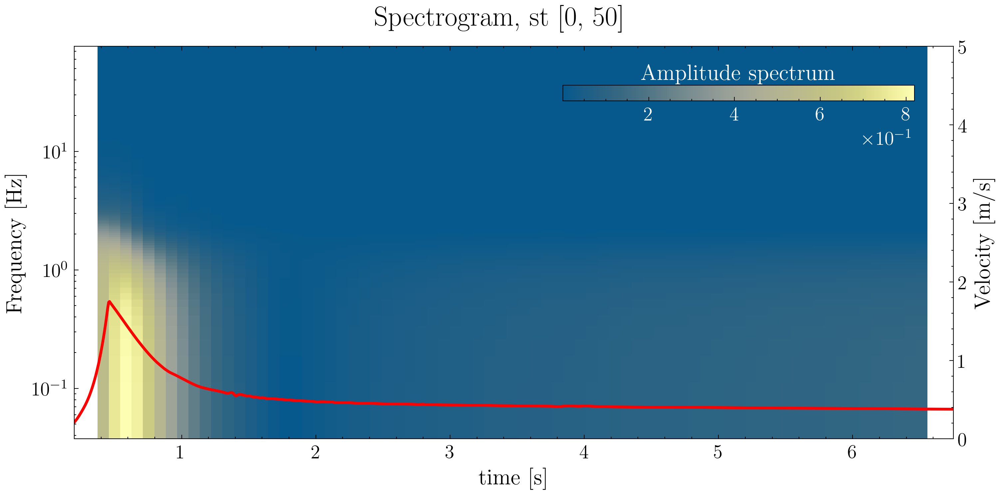

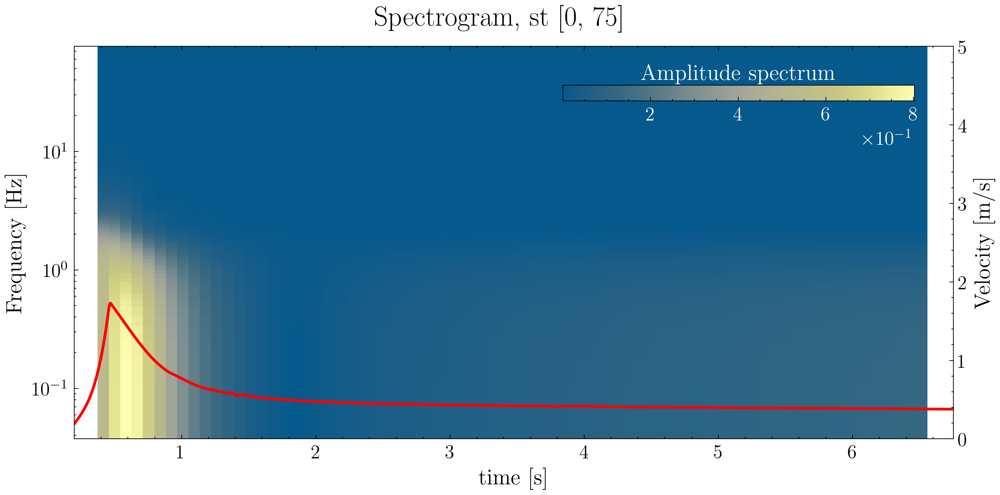

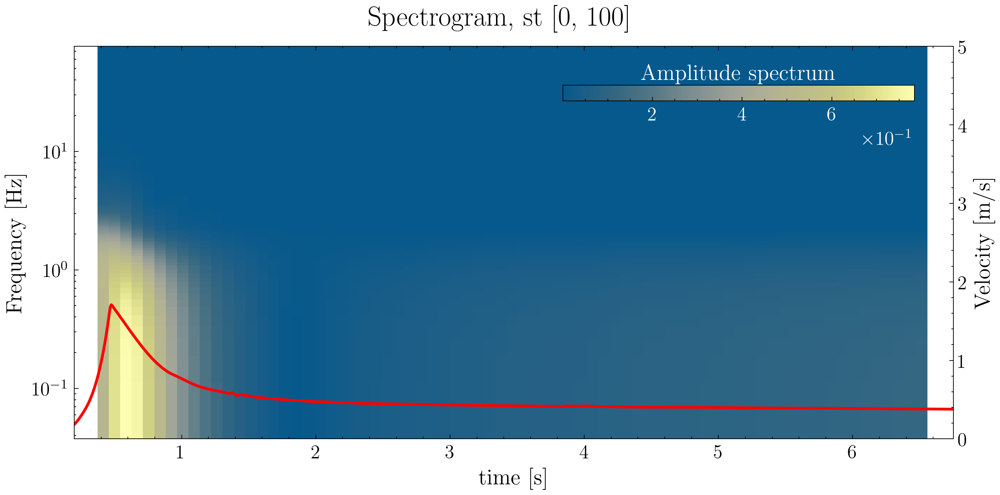

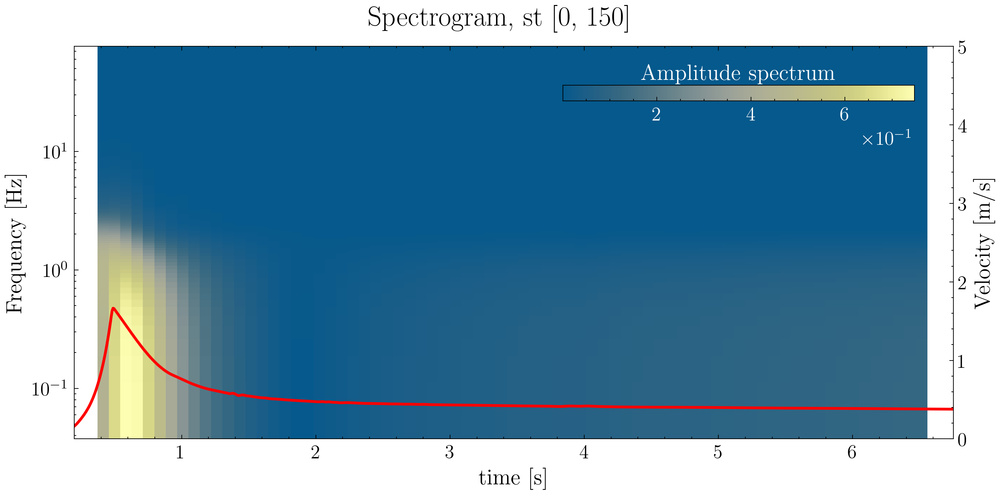

...

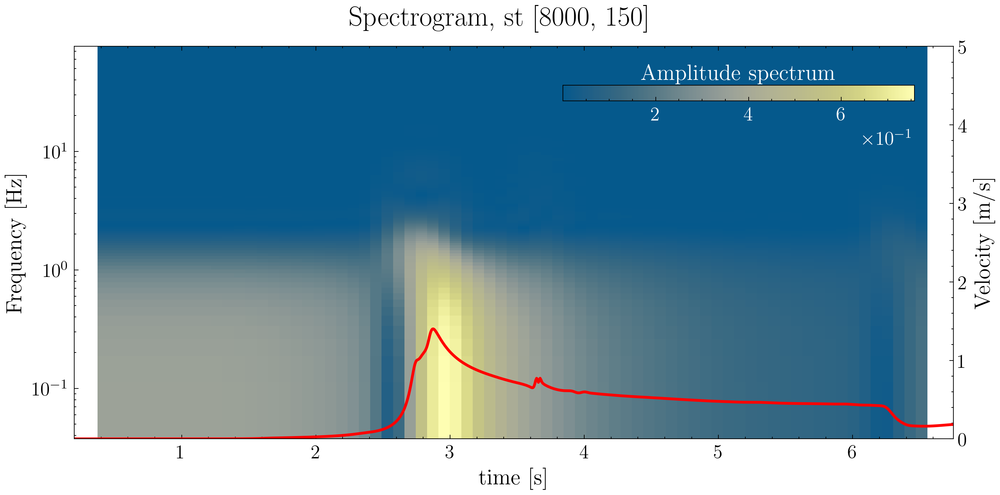

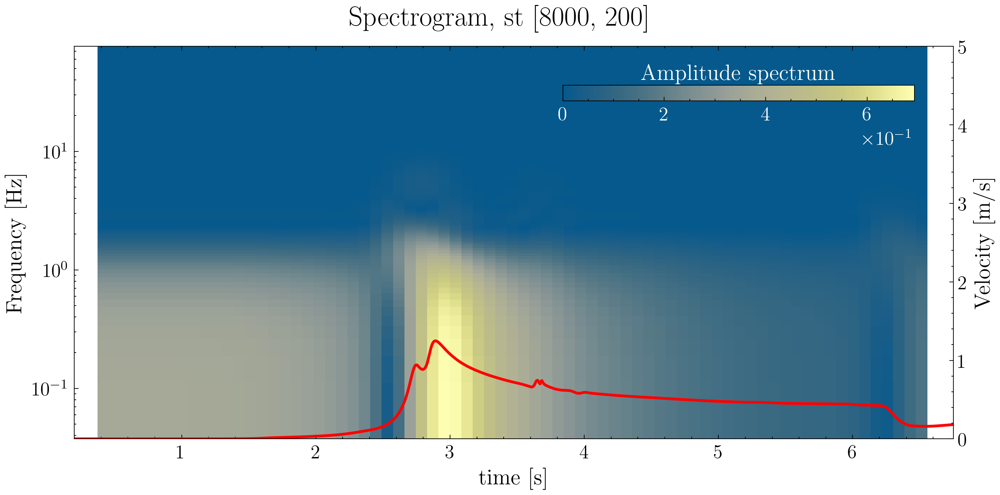

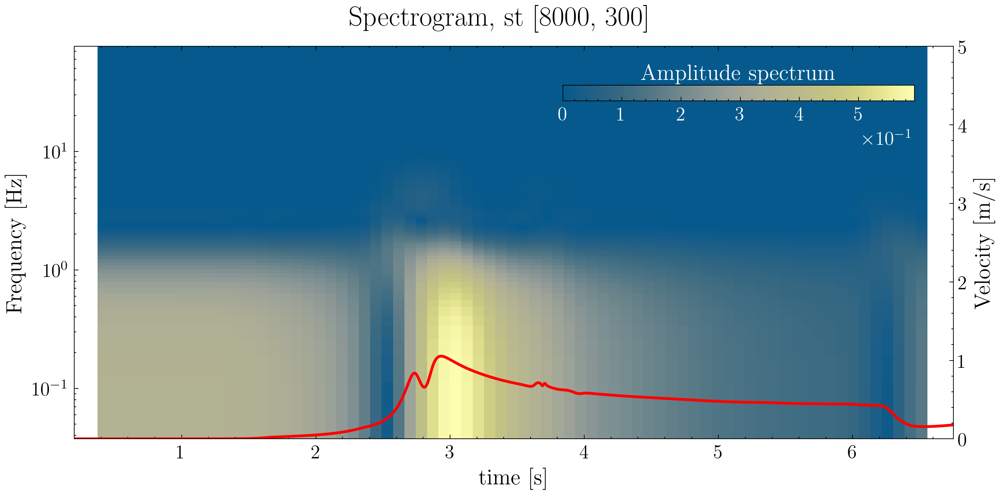

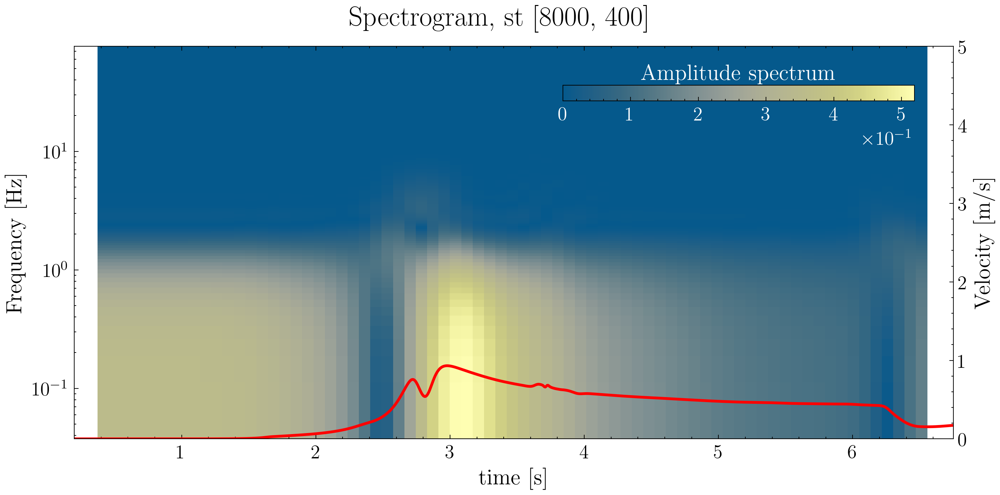

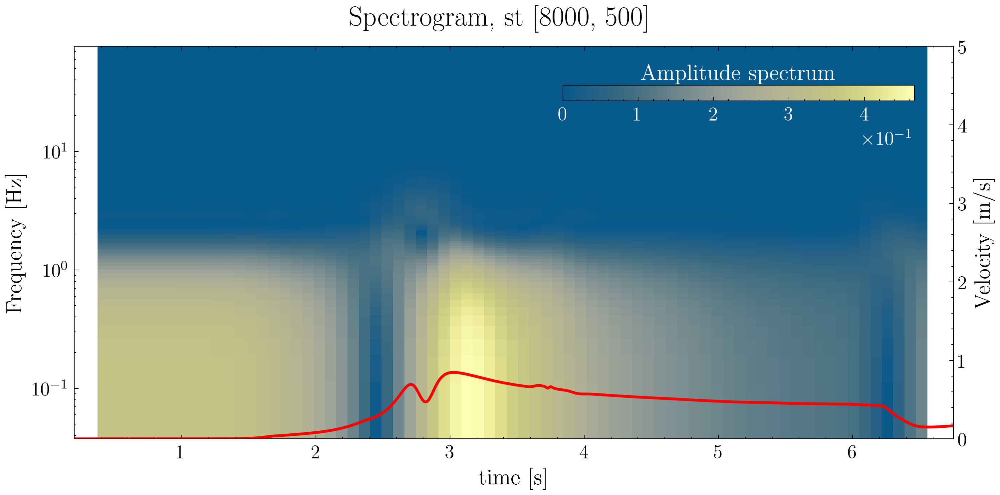

In [8]:
for i in range(len(ListReceivers)):
    fig,ax,ax2 = Receiver2Spectrogram(ListReceivers[i], ListReceivers[i].VelX, yLabel="Velocity [m/s]", 
                         wlen = 40, mult=20, cmap=cmap)
    ax2.set_ylim([0,5])
    ax.set_xlim([0.2,6.75])

/home/nico/miniconda3/envs/jane/lib/python3.5/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


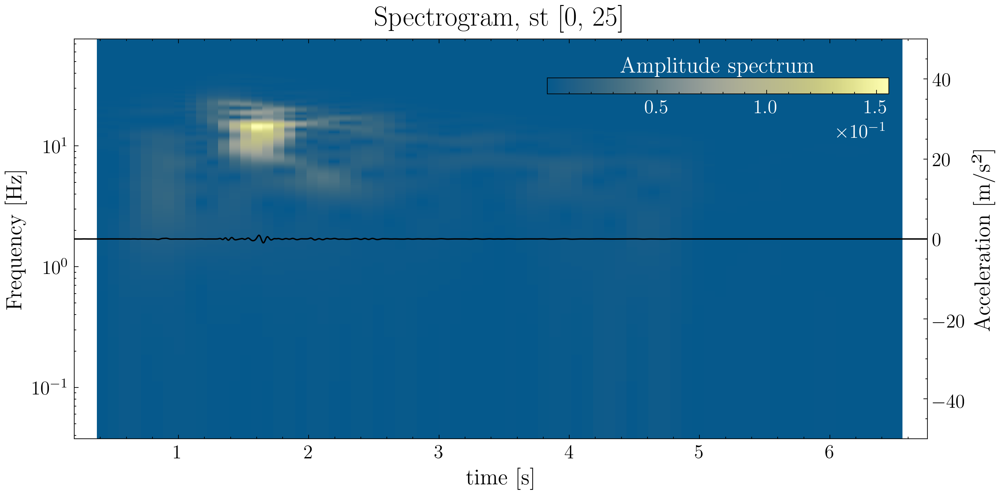

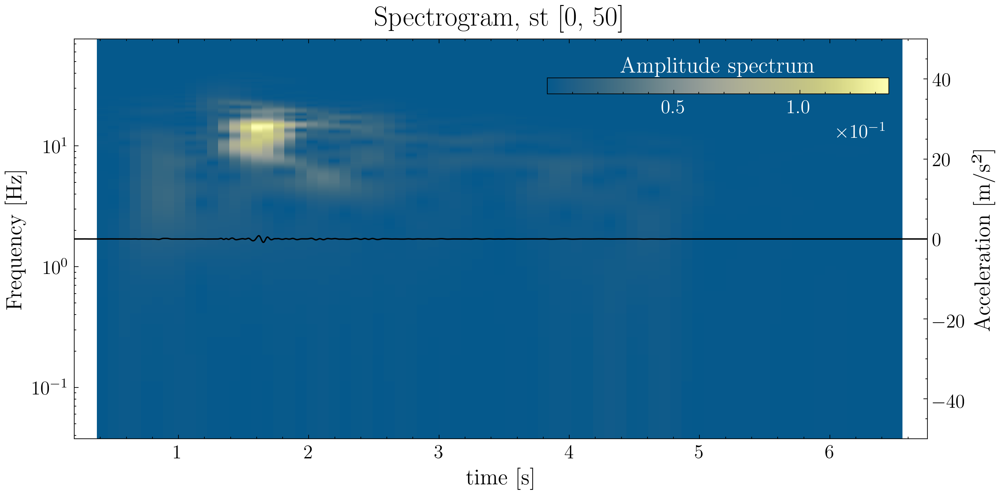

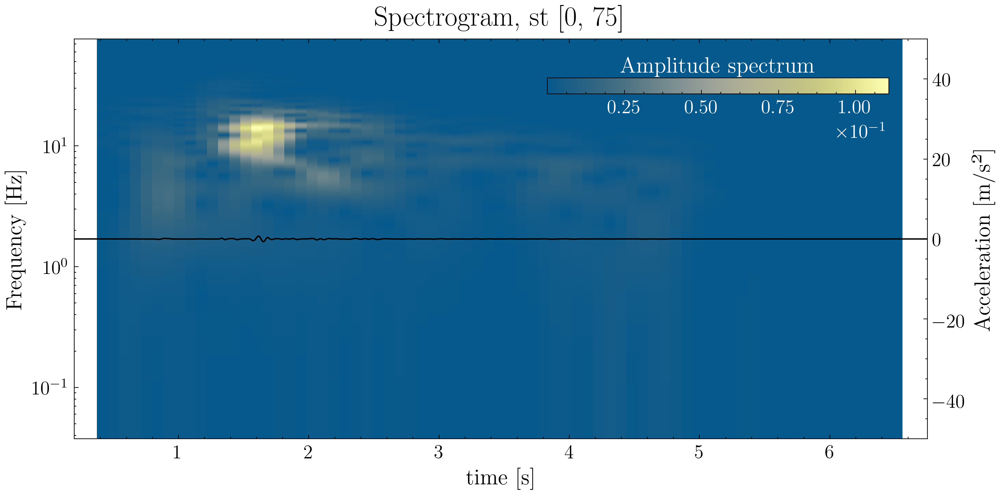

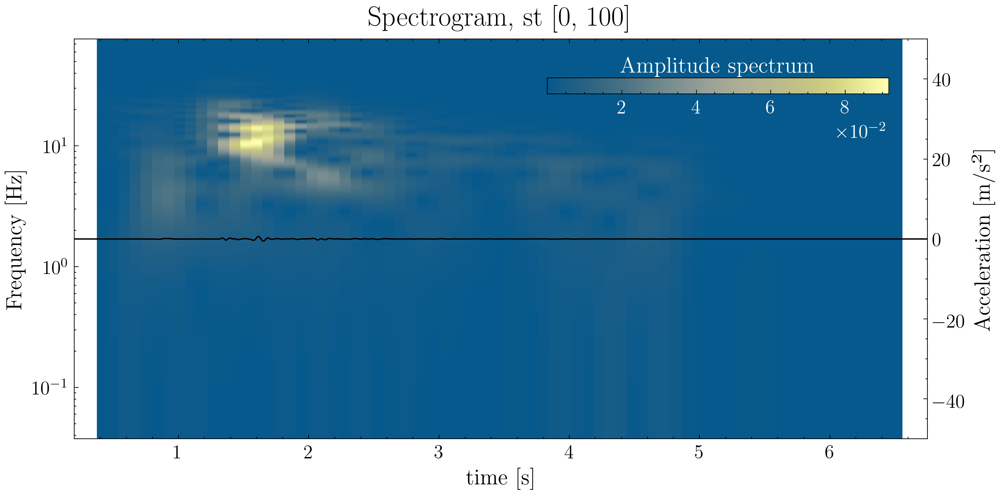

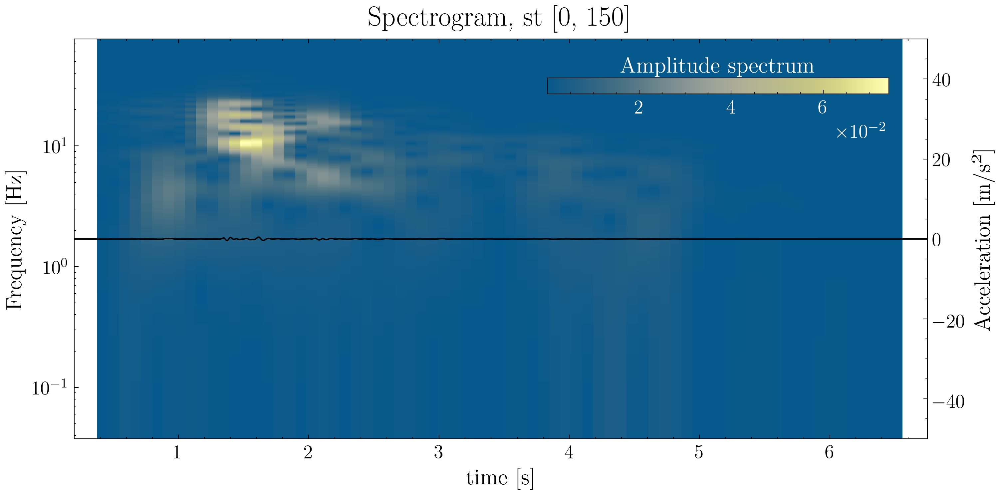

...

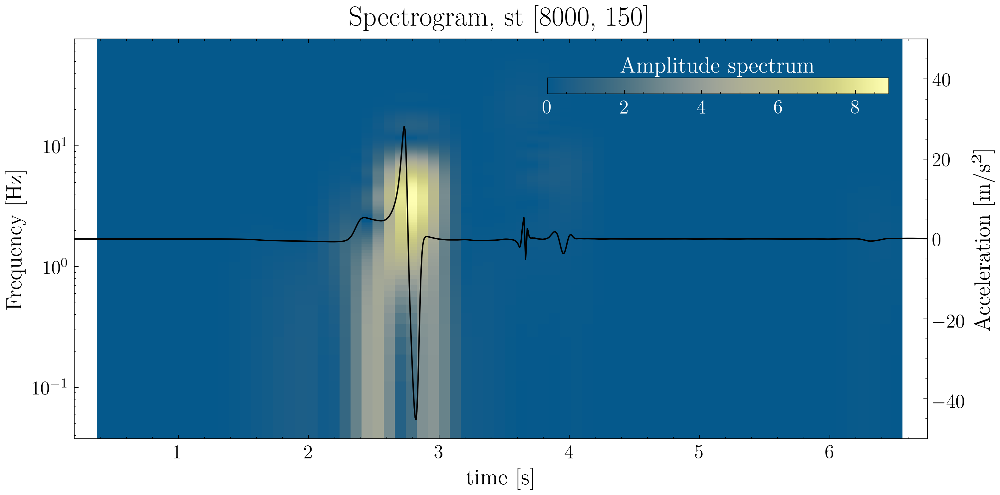

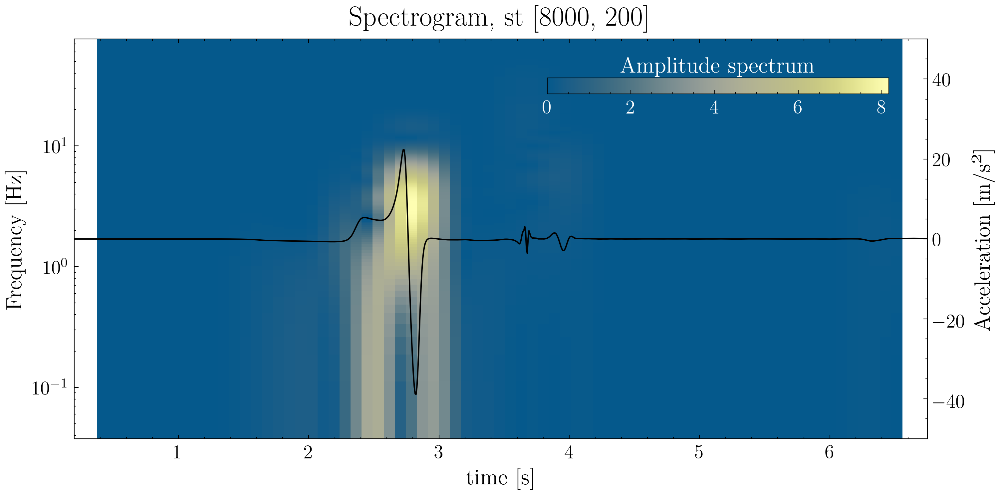

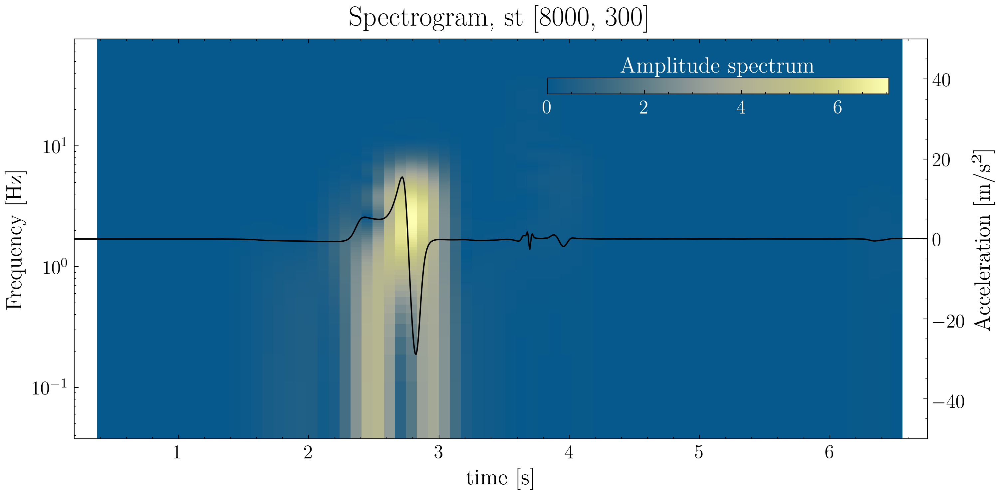

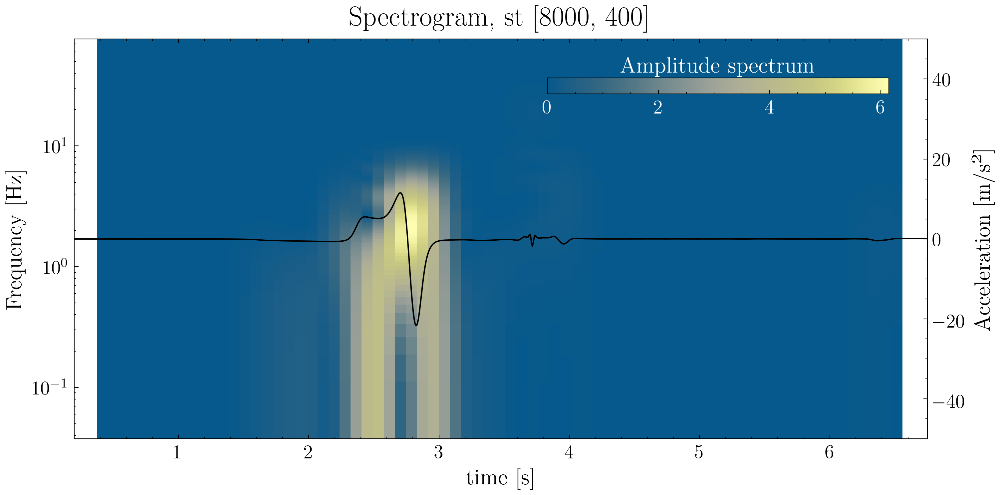

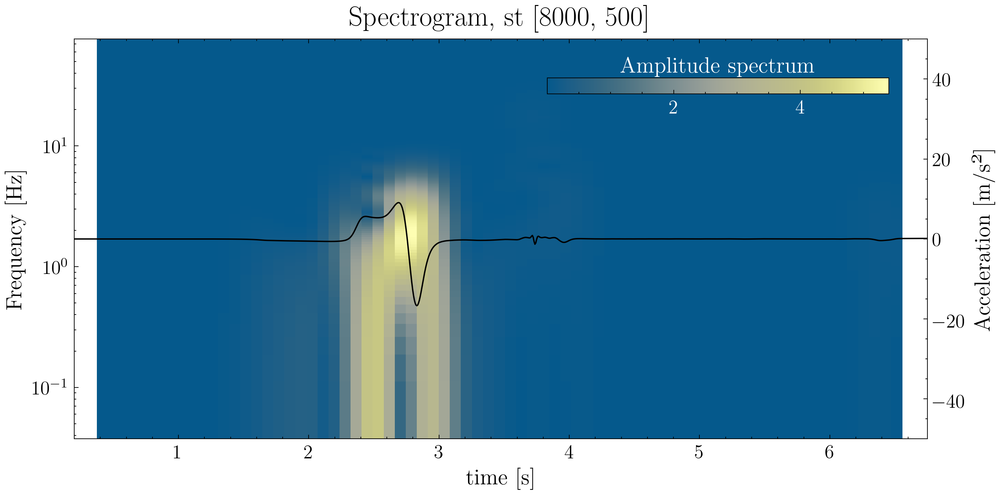

In [9]:
for i in range(len(ListReceivers)):
    fig,ax,ax2 = Receiver2GradientSpectrogram(ListReceivers[i], ListReceivers[i].VelY, yLabel="Acceleration [m/s²]", 
                         wlen = 40, mult=20, cmap=cmap)

    ax.set_xlim([0.2,6.75])
    ax2.set_ylim([-5e1,5e1])
    